## version1: 11/13 –
ライブラリを使用

### Library

In [67]:
# import libraries
import os
import math
import time
import yaml
import datetime 
import numpy as np
import pandas as pd
from tqdm import trange
from tqdm.notebook import tqdm

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

import torch
import torch.nn as nn
from torch.nn import LayerNorm
from torch.utils.data import Dataset, DataLoader
from torch.nn import TransformerEncoder, TransformerDecoder, TransformerEncoderLayer, TransformerDecoderLayer

# set random seed
fix_seed = 1111
np.random.seed(fix_seed)
torch.manual_seed(fix_seed)

# set device 
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
print(device)

mps


### Import parameters and data

In [77]:
# load parameters
with open('/Users/koki/PycharmProjects/MasterThesis/params/config_transformer.yml', 'r') as yml:
    yaml_data = yaml.safe_load(yml)

In [83]:
# import data
df = pd.read_csv('/Users/koki/PycharmProjects/MasterThesis/data/preprocessed/201601to202309_10areas_for_analysis.csv')
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')

# # covid dummy
# covid_1 = pd.date_range(start='2020-03-01', end='2020-05-30 21:00', freq='3h')  # 第1波
# covid_2 = pd.date_range(start='2020-11-01', end='2021-04-30 21:00', freq='3h')  # 第3波, 第4波
# covid_3 = pd.date_range(start='2021-07-01', end='2021-09-30 21:00', freq='3h')  # 第5波
# covid_4 = pd.date_range(start='2021-12-01', end='2022-03-31 21:00', freq='3h')  # 第6波(オミクロン株の拡大)
# covid = covid_1.union(covid_2).union(covid_3).union(covid_4)
# df['covid'] = df.index.map(lambda d: int(d in covid))

In [84]:
df = df.drop(columns=[
                      'month_1', 'month_10', 'month_11', 'month_12', 'month_2', 'month_3', 
                      'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9',
                      'hour_0', 'hour_12', 'hour_15', 'hour_18', 'hour_21', 'hour_3', 'hour_6', 'hour_9',
                      # 'dow_Fri', 'dow_Mon', 'dow_Sat', 'dow_Sun', 'dow_Thu', 'dow_Tue', 'dow_Wed'
                    ])

### Define dataset

In [85]:
class SequenceDataset(Dataset):
    def __init__(self, dataframe, seq_len_src=56, seq_len_tgt=8, lag_len=8):
        self.seq_len_src = seq_len_src
        self.lag_len = lag_len
        self.seq_len_tgt = seq_len_tgt
        self.df = torch.tensor(dataframe.values).float()
        self.len = math.floor((len(self.df) - self.seq_len_src - self.seq_len_tgt) / self.lag_len) + 1

    def __len__(self):
        return self.len

    def __getitem__(self, i):
        if type(i) == slice:
            raise Exception('Exception: Expected int, inputted slice!')
            
        X = self.df[i*self.lag_len:i*self.lag_len+self.seq_len_src]
        Y = self.df[i*self.lag_len+self.seq_len_src:i*self.lag_len+self.seq_len_src+self.seq_len_tgt]
        
        return X, Y
    
    def input_size(self):
        return self.df.shape[1]

### Split data

In [86]:
batch_size = yaml_data['dataset']['batch_size']
seq_len_src = yaml_data['dataset']['seq_len_src']
seq_len_tgt = yaml_data['dataset']['seq_len_tgt']
lag_len = yaml_data['dataset']['lag_len']

# set start dates and end dates
train_start = yaml_data['dataset']['train_start']
train_end = yaml_data['dataset']['train_end']
valid_start = yaml_data['dataset']['valid_start']
valid_end = yaml_data['dataset']['valid_end']
test_start = yaml_data['dataset']['test_start']
test_end = yaml_data['dataset']['test_end']

# split df into train, valid and test data
df_train = df.loc[train_start:train_end].copy()
df_valid = df.loc[valid_start:valid_end].copy()
df_test = df.loc[test_start:test_end].copy()

# # choose hours to use
# time_list = yaml_data['dataset']['time_list']
# if time_list != 'all':
#     df = df.loc[df.index.hour.isin(time_list)]

# df for prediction
df_valid_for_pred = pd.concat([df_train.iloc[-seq_len_src:, :], df_valid])  # valid_dataの1期目から予測するために、前日もテストデータに含める。
df_test_for_pred = pd.concat([df_valid.iloc[-seq_len_src:, :], df_test])  # test_dataの1期目から予測するために、前日もテストデータに含める。

# print the fraction of each dataset
print("Train set fraction: {:.3f}%".format(len(df_train)/len(df)*100))
print("Valid set fraction: {:.3f}%".format(len(df_valid)/len(df)*100))
print("Test set fraction: {:.3f}%".format(len(df_test)/len(df)*100))

Train set fraction: 77.456%
Valid set fraction: 12.898%
Test set fraction: 9.647%


### Set dataloader

In [93]:
df_train.index

DatetimeIndex(['2016-01-01 00:00:00', '2016-01-01 03:00:00',
               '2016-01-01 06:00:00', '2016-01-01 09:00:00',
               '2016-01-01 12:00:00', '2016-01-01 15:00:00',
               '2016-01-01 18:00:00', '2016-01-01 21:00:00',
               '2016-01-02 00:00:00', '2016-01-02 03:00:00',
               ...
               '2021-12-30 18:00:00', '2021-12-30 21:00:00',
               '2021-12-31 00:00:00', '2021-12-31 03:00:00',
               '2021-12-31 06:00:00', '2021-12-31 09:00:00',
               '2021-12-31 12:00:00', '2021-12-31 15:00:00',
               '2021-12-31 18:00:00', '2021-12-31 21:00:00'],
              dtype='datetime64[ns]', name='datetime', length=17536, freq=None)

In [92]:
df_train['datetime'] = df_train.index
df_train

TypeError: float() argument must be a string or a real number, not 'DatetimeIndex'

In [91]:
# create dataset
train_dataset = SequenceDataset(df_train, seq_len_src=56, seq_len_tgt=8, lag_len=1)
valid_dataset = SequenceDataset(df_valid, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)
test_dataset = SequenceDataset(df_test, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)

# dataset for prediction
valid_dataset_for_pred = SequenceDataset(df_valid_for_pred, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)
test_dataset_for_pred = SequenceDataset(df_test_for_pred, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)

print("Length of each dataset:")
print("    Train:{}, Valid:{}, Test:{}".format(len(train_dataset), len(valid_dataset), len(test_dataset)))

# create dataloader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=0, pin_memory=True)
# valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)

# check the shape of a batch
X, y = next(iter(train_loader))
print("Features shape:", X.shape)  # [batch size, sequence length, number of features]
print("Target shape:", y.shape)

TypeError: can't convert np.ndarray of type numpy.object_. The only supported types are: float64, float32, float16, complex64, complex128, int64, int32, int16, int8, uint8, and bool.

In [94]:
from huggingface_hub import hf_hub_download
import torch
from transformers import TimeSeriesTransformerModel

file = hf_hub_download(
    repo_id="hf-internal-testing/tourism-monthly-batch", filename="train-batch.pt", repo_type="dataset"
)
batch = torch.load(file)

# model = TimeSeriesTransformerModel.from_pretrained("huggingface/time-series-transformer-tourism-monthly")

# # during training, one provides both past and future values
# # as well as possible additional features
# outputs = model(
#     past_values=batch["past_values"],
#     past_time_features=batch["past_time_features"],
#     past_observed_mask=batch["past_observed_mask"],
#     static_categorical_features=batch["static_categorical_features"],
#     static_real_features=batch["static_real_features"],
#     future_values=batch["future_values"],
#     future_time_features=batch["future_time_features"],
# )

# last_hidden_state = outputs.last_hidden_state

In [97]:
batch["past_values"].shape

torch.Size([64, 61])

In [105]:
batch["future_time_features"][0]

tensor([[ 0.2273,  2.3541],
        [ 0.3182,  2.3560],
        [ 0.4091,  2.3579],
        [ 0.5000,  2.3598],
        [-0.5000,  2.3617],
        [-0.4091,  2.3636],
        [-0.3182,  2.3655],
        [-0.2273,  2.3674],
        [-0.1364,  2.3692],
        [-0.0455,  2.3711],
        [ 0.0455,  2.3729],
        [ 0.1364,  2.3747],
        [ 0.2273,  2.3766],
        [ 0.3182,  2.3784],
        [ 0.4091,  2.3802],
        [ 0.5000,  2.3820],
        [-0.5000,  2.3838],
        [-0.4091,  2.3856],
        [-0.3182,  2.3874],
        [-0.2273,  2.3892],
        [-0.1364,  2.3909],
        [-0.0455,  2.3927],
        [ 0.0455,  2.3945],
        [ 0.1364,  2.3962]])

In [74]:
from torch.utils.data import Dataset, TensorDataset, DataLoader



In [76]:
from transformers import TimeSeriesTransformerConfig, TimeSeriesTransformerModel, TimeSeriesTransformerForPrediction


configuration = TimeSeriesTransformerConfig(prediction_length=12,
                                            input_size=10,
                                            lags_sequence=[],
                                            num_time_features=0,
                                            num_dynamic_real_features=0,
                                            num_static_categorical_features=36,
                                            num_static_real_features=0,
                                           )

model = TimeSeriesTransformerModel(configuration)

model.train()
total_loss = []
for src, tgt in train_loader:

    src = src.float().to(device)
    tgt = tgt.float().to(device)

    outputs = model(
                    past_values=src,
                    past_time_features=,
                    past_observed_mask=batch["past_observed_mask"],
                    static_categorical_features=batch["static_categorical_features"],
                    static_real_features=batch["static_real_features"],
                    future_values=tgt,
                    future_time_features=batch["future_time_features"])
    optimizer.zero_grad()

    loss = criterion(output[:,:,0:num_features_pred], tgt[:,:,0:num_features_pred])

    loss = outputs.loss
    loss.backward()

    total_loss.append(loss.cpu().detach())
    optimizer.step()

# change learning rate
# scheduler.step()
# during training, one provides both past and future values
# as well as possible additional features





# during inference, one only provides past values
# as well as possible additional features
# the model autoregressively generates future values
outputs = model.generate(
    past_values=batch["past_values"],
    past_time_features=batch["past_time_features"],
    past_observed_mask=batch["past_observed_mask"],
    static_categorical_features=batch["static_categorical_features"],
    static_real_features=batch["static_real_features"],
    future_time_features=batch["future_time_features"],
)

mean_prediction = outputs.sequences.mean(dim=1)

NameError: name 'batch' is not defined

### Define embedding

In [22]:
#位置エンコーディングの定義
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout: float = 0.1, max_len: int = 5000) -> None:
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        self.d_model = d_model

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1)]
        return self.dropout(x)

In [63]:
class TimeFeature:
    def __init__(self):
        pass

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        pass

    def __repr__(self):
        return self.__class__.__name__ + "()"


class SecondOfMinute(TimeFeature):
    """Minute of hour encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return index.second / 59.0 - 0.5


class MinuteOfHour(TimeFeature):
    """Minute of hour encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return index.minute / 59.0 - 0.5


class HourOfDay(TimeFeature):
    """Hour of day encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return index.hour / 23.0 - 0.5


class DayOfWeek(TimeFeature):
    """Hour of day encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return index.dayofweek / 6.0 - 0.5


class DayOfMonth(TimeFeature):
    """Day of month encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return (index.day - 1) / 30.0 - 0.5


class DayOfYear(TimeFeature):
    """Day of year encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return (index.dayofyear - 1) / 365.0 - 0.5


class MonthOfYear(TimeFeature):
    """Month of year encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return (index.month - 1) / 11.0 - 0.5


class WeekOfYear(TimeFeature):
    """Week of year encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return (index.isocalendar().week - 1) / 52.0 - 0.5


def time_features_from_frequency_str(freq_str: str) -> list[TimeFeature]:
    """
    Returns a list of time features that will be appropriate for the given frequency string.
    Parameters
    ----------
    freq_str
        Frequency string of the form [multiple][granularity] such as "12H", "5min", "1D" etc.
    """

    features_by_offsets = {
        offsets.YearEnd: [],
        offsets.QuarterEnd: [MonthOfYear],
        offsets.MonthEnd: [MonthOfYear],
        offsets.Week: [DayOfMonth, WeekOfYear],
        offsets.Day: [DayOfWeek, DayOfMonth, DayOfYear],
        offsets.BusinessDay: [DayOfWeek, DayOfMonth, DayOfYear],
        offsets.Hour: [HourOfDay, DayOfWeek, DayOfMonth, DayOfYear],
        offsets.Minute: [
            MinuteOfHour,
            HourOfDay,
            DayOfWeek,
            DayOfMonth,
            DayOfYear,
        ],
        offsets.Second: [
            SecondOfMinute,
            MinuteOfHour,
            HourOfDay,
            DayOfWeek,
            DayOfMonth,
            DayOfYear,
        ],
    }

    offset = to_offset(freq_str)

    for offset_type, feature_classes in features_by_offsets.items():
        if isinstance(offset, offset_type):
            return [cls() for cls in feature_classes]

    supported_freq_msg = f"""
    Unsupported frequency {freq_str}
    The following frequencies are supported:
        Y   - yearly
            alias: A
        M   - monthly
        W   - weekly
        D   - daily
        B   - business days
        H   - hourly
        T   - minutely
            alias: min
        S   - secondly
    """
    raise RuntimeError(supported_freq_msg)
    
    
def time_features(dates: np.array, freq:str='h') -> np.array:
    """時間特徴量を、指定されたサンプリング間隔に応じて変換。それぞれの値は[-0.5, 0.5]に正規化されている。
    
    > * Q - [month]
    > * M - [month]
    > * W - [Day of month, week of year]
    > * D - [Day of week, day of month, day of year]
    > * B - [Day of week, day of month, day of year]
    > * H - [Hour of day, day of week, day of month, day of year]
    > * T - [Minute of hour*, hour of day, day of week, day of month, day of year]
    > * S - [Second of minute, minute of hour, hour of day, day of week, day of month, day of year]
    *minute returns a number from 0-3 corresponding to the 15 minute period it falls into.

    ※ 著者実装では、学習可能なパラメータを持たせない（単なるルックアップテーブルとして保持）場合の実装もあるが、ここでは省略。

    Parameters
    ----------
    dates : np.array
        日時が格納されている配列
    freq : str, optional
        サンプリング間隔, by default 'h'
        指定方法はpandasのdatetimeの記法に従う。
        例: "1h", "2h", "3D", etc...

    Returns
    -------
    np.array
        変換後の時間特徴量
        【例】: 2023-5-16 19:00 -> [Hour of day, day of week, day of month, day of year] の4次元
    """    
    dates = pd.to_datetime(dates.date.values)
    ret = np.vstack([feat(dates) for feat in time_features_from_frequency_str(freq)]).transpose(1, 0)
    return ret

In [64]:
class PositionalEmbedding(nn.Module):
    def __init__(self, d_model:int, max_len:int=5000):
        super(PositionalEmbedding, self).__init__()
        # Compute the positional encodings once in log space.
        pe = torch.zeros(max_len, d_model).float()
        pe.require_grad = False

        position = torch.arange(0, max_len).float().unsqueeze(1)
        div_term = (torch.arange(0, d_model, 2).float() * -(np.log(10000.0) / d_model)).exp()

        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)

        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        return self.pe[:, :x.size(1)]
    
    
class TokenEmbedding(nn.Module):
    def __init__(self, c_in:int, d_model:int):
        super(TokenEmbedding, self).__init__()
        padding = 1 if torch.__version__>='1.5.0' else 2
        self.tokenConv = nn.Conv1d(in_channels=c_in, out_channels=d_model,
                                    kernel_size=3, padding=padding, padding_mode='circular')
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.kaiming_normal_(m.weight,mode='fan_in',nonlinearity='leaky_relu')

    def forward(self, x):
        x = self.tokenConv(x.permute(0, 2, 1)).transpose(1,2)
        return x
    

class TimeFeatureEmbedding(nn.Module):
    def __init__(self, d_model:int, freq:str='h'):
        super(TimeFeatureEmbedding, self).__init__()

        freq_map = {'h':4, 't':5, 's':6, 'm':1, 'a':1, 'w':2, 'd':3, 'b':3}
        d_inp = freq_map[freq]
        self.embed = nn.Linear(d_inp, d_model)

    def forward(self, x):
        return self.embed(x)
    

class DataEmbedding(nn.Module):
    def __init__(self, c_in, d_model, freq='h', dropout=0.1):
        super(DataEmbedding, self).__init__()

        self.value_embedding = TokenEmbedding(c_in=c_in, d_model=d_model)
        self.position_embedding = PositionalEmbedding(d_model=d_model)
        self.temporal_embedding = TimeFeatureEmbedding(d_model=d_model, freq=freq)

        self.dropout = nn.Dropout(p=dropout)

    def forward(self, x, x_mark):
        x = self.value_embedding(x) + self.position_embedding(x) + self.temporal_embedding(x_mark)

        return self.dropout(x)

In [65]:
# 日付変換の例
df_stamp = pd.DataFrame({"date": [pd.to_datetime("2023-5-16 19:00"), pd.to_datetime("2023-5-16 20:00")]})
data_stamp = time_features(df_stamp, freq="h")
print(data_stamp) 

NameError: name 'offsets' is not defined

### Define Transformer

In [23]:
class Transformer(nn.Module):
    def __init__(self, num_encoder_layers, num_decoder_layers,
        d_model, d_output,
        dim_feedforward = 512, dropout = 0.1, nhead = 8):
        
        super(Transformer, self).__init__()
        
        self.positional_encoding = PositionalEncoding(d_model, dropout=dropout)
        
        #エンコーダの定義
        encoder_layer = TransformerEncoderLayer(d_model=d_model, 
                                                nhead=nhead, 
                                                dim_feedforward=dim_feedforward,
                                                dropout=dropout,
                                                batch_first=True,
                                                activation='gelu'
                                               )
        encoder_norm = LayerNorm(d_model)
        self.transformer_encoder = TransformerEncoder(encoder_layer, 
                                                      num_layers=num_encoder_layers,
                                                      norm=encoder_norm
                                                     )
        
        #デコーダの定義
        decoder_layer = TransformerDecoderLayer(d_model=d_model, 
                                                nhead=nhead, 
                                                dim_feedforward=dim_feedforward,
                                                dropout=dropout,
                                                batch_first=True,
                                                activation='gelu'
                                               )
        decoder_norm = LayerNorm(d_model)
        self.transformer_decoder = TransformerDecoder(decoder_layer, 
                                                      num_layers=num_decoder_layers, 
                                                      norm=decoder_norm)
        
        #出力層の定義
        self.output = nn.Linear(d_model, d_output)
        

    def forward(self, src, tgt, mask_src, mask_tgt):
        #mask_src, mask_tgtはセルフアテンションの際に未来のデータにアテンションを向けないためのマスク
        
        embedding_src = self.positional_encoding(src)
        memory = self.transformer_encoder(embedding_src, mask_src)
        
        embedding_tgt = self.positional_encoding(tgt)
        outs = self.transformer_decoder(embedding_tgt, memory, mask_tgt)
        
        output = self.output(outs)
        return output

    def encode(self, src, mask_src):
        return self.transformer_encoder(self.positional_encoding(src), mask_src)

    def decode(self, tgt, memory, mask_tgt):
        return self.transformer_decoder(self.positional_encoding(tgt), memory, mask_tgt)


### Define masks

In [24]:
def create_mask(src, tgt):
    
    seq_len_src = src.shape[1]
    seq_len_tgt = tgt.shape[1]

    mask_tgt = generate_square_subsequent_mask(seq_len_tgt).to(device)
    mask_src = generate_square_subsequent_mask(seq_len_src).to(device)

    return mask_src, mask_tgt


def generate_square_subsequent_mask(seq_len):
    mask = torch.triu(torch.full((seq_len, seq_len), float('-inf')), diagonal=1)
    return mask


### Define training, validation, and prediction

In [25]:
def train(model, data_loader, optimizer, criterion, num_features_pred):
    model.train()
    total_loss = []
    for src, tgt in data_loader:
        
        src = src.float().to(device)
        tgt = tgt.float().to(device)

        input_tgt = torch.cat((src[:,-1:,:],tgt[:,:-1,:]), dim=1)
        
        mask_src, mask_tgt = create_mask(src, input_tgt)
        
        output = model(src=src, tgt=input_tgt, mask_src=mask_src, mask_tgt=mask_tgt)
        
        optimizer.zero_grad()
        
        loss = criterion(output[:,:,0:num_features_pred], tgt[:,:,0:num_features_pred])
        
        loss.backward()
        total_loss.append(loss.cpu().detach())
        optimizer.step()
    
    # change learning rate
    scheduler.step()
        
    return np.average(total_loss)


def predict(model, dataset, num_features_pred):
    model.eval()
    with torch.no_grad():
        all_outputs = torch.zeros(1, 1, df.shape[1]).to(device)
        for t in tqdm(range(len(dataset))):  # (len(df_test)-8)/8 = 92回予測が必要
            src = dataset[t][0].float().to(device)
            tgt = dataset[t][1].float().to(device)

            # add a batch size of 1 for the encoder (= [1, :, :])
            src = src.unsqueeze(0)  
            tgt = tgt.unsqueeze(0)

            seq_len_src = src.shape[1]
            seq_len_tgt = tgt.shape[1]
            
            mask_src = (torch.zeros(seq_len_src, seq_len_src)).type(torch.bool)
            mask_src = mask_src.float().to(device)
            
            memory = model.encode(src, mask_src)
            outputs = src[:, -1:, :]

            #ループさせて逐次的に予測する
            for i in range(seq_len_tgt):

                mask_tgt = (generate_square_subsequent_mask(outputs.size(1))).to(device)

                output = model.decode(outputs, memory, mask_tgt)
                output = model.output(output)  # output.shape = [バッチサイズ1, ウィンドウサイズi(累積される), 変数]

                # convert predicted dummies to the actual ones
                output = torch.cat([output[:, -1:, :num_features_pred], tgt[:, i:i+1, num_features_pred:]], dim=2)

                # concat outputs and output above
                outputs = torch.cat([outputs, output], dim=1)
                
            all_outputs = torch.cat([all_outputs, outputs[:, 1:, :]], dim=1)

    return all_outputs[-1, 1:, :num_features_pred].to('cpu').detach().numpy()  # all_outputs[-1, 1:, :num_features_pred] → バッチサイズを消す＆all_outputsの最初の0を消す

### Define parameters

In [26]:
# d_input = 1
d_output = train_dataset.input_size()
d_model = train_dataset.input_size()
nhead = yaml_data['model']['nhead'] 
dim_feedforward = yaml_data['model']['dim_feedforward']
num_encoder_layers = yaml_data['model']['num_encoder_layers']
num_decoder_layers = yaml_data['model']['num_decoder_layers']
dropout = yaml_data['model']['dropout']
epochs = yaml_data['training']['n_epochs']
learning_rate = yaml_data['training']['learning_rate']
num_features_pred=yaml_data['training']['num_features_pred']
milestones = yaml_data['training']['milestones']
gamma = yaml_data['training']['gamma']

model = Transformer(num_encoder_layers=num_encoder_layers,
                    num_decoder_layers=num_decoder_layers,
                    d_model=d_model,
                    d_output=d_output,
                    dim_feedforward=dim_feedforward,
                    dropout=dropout, nhead=nhead)

# for p in model.parameters():
#     if p.dim() > 1:
#         nn.init.xavier_uniform_(p)

model = model.to(device)
criterion = torch.nn.MSELoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=milestones, gamma=gamma)

### Training

In [58]:
i = 0 
for x, y in train_loader:
    src = x
    print(x.shape)
    embedding_src = model.positional_encoding(x.to(device))
    i += 1
    if i == 1:
        break
embedding_src.shape

torch.Size([16, 56, 46])


torch.Size([16, 56, 46])

In [59]:
src

tensor([[[6.8901e+04, 9.2420e+04, 2.2500e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [1.0638e+05, 1.2418e+05, 3.1581e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [1.1572e+05, 1.2667e+05, 3.1749e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         ...,
         [2.2137e+04, 1.4970e+04, 1.7651e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [1.6638e+04, 9.7360e+03, 1.5441e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [1.6247e+04, 1.4921e+04, 1.8491e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00]],

        [[1.8839e+04, 1.0278e+04, 1.5665e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [1.8187e+04, 1.4126e+04, 1.8577e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [6.8812e+04, 8.7487e+04, 2.3645e+04,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         ...,
         [1.1991e+05, 1.3333e+05, 3.7390e+04,  ..., 0.0000e+00,
          0.000

In [57]:
embedding_src

tensor([[[1.1561e+05, 9.7572e+04, 3.4326e+04,  ..., 1.0000e+00,
          0.0000e+00, 1.0000e+00],
         [3.5315e+04, 2.6319e+04, 1.9490e+04,  ..., 1.0000e+00,
          1.4925e-04, 1.0000e+00],
         [2.2058e+04, 1.0593e+04, 1.5729e+04,  ..., 1.0000e+00,
          2.9850e-04, 1.0000e+00],
         ...,
         [5.7353e+04, 9.0054e+04, 3.7528e+04,  ..., 9.9993e-01,
          7.9101e-03, 9.9997e-01],
         [7.4435e+04, 1.0208e+05, 4.1577e+04,  ..., 9.9993e-01,
          8.0594e-03, 9.9997e-01],
         [6.6835e+04, 8.0928e+04, 3.3202e+04,  ..., 9.9992e-01,
          8.2086e-03, 9.9997e-01]],

        [[7.5439e+04, 9.0479e+04, 2.9569e+04,  ..., 2.0000e+00,
          0.0000e+00, 1.0000e+00],
         [3.2299e+04, 2.7793e+04, 1.8662e+04,  ..., 2.0000e+00,
          1.4925e-04, 1.0000e+00],
         [1.3373e+04, 1.0051e+04, 1.4479e+04,  ..., 2.0000e+00,
          2.9850e-04, 1.0000e+00],
         ...,
         [4.5659e+04, 6.6777e+04, 1.9974e+04,  ..., 1.9999e+00,
          7.910

In [27]:
start = time.time()
train_losses = []
with trange(epochs) as tr:
    for epoch in tr:
        # train
        loss_train = train(model=model, 
                           data_loader=train_loader, 
                           optimizer=optimizer,
                           criterion=criterion, 
                           num_features_pred=num_features_pred)
        # convert to RMSE
        loss_train = math.sqrt(loss_train)
        # append epoch loss
        train_losses.append(loss_train)  
        # progress bar 
        tr.set_postfix(Train_loss="{0:.3f}".format(loss_train))

# calculate execution time
end = time.time()
t = math.floor(end-start)
elapsed_hour = t // 3600
elapsed_minute = (t % 3600) // 60
elapsed_second = (t % 3600 % 60)
elapsed_time = str(elapsed_hour).zfill(2) + ":" + str(elapsed_minute).zfill(2) + ":" + str(elapsed_second).zfill(2)

100%|████████████████████████████████████████████████████████████████████████| 100/100 [1:42:52<00:00, 61.72s/it, Train_loss=13220.421]


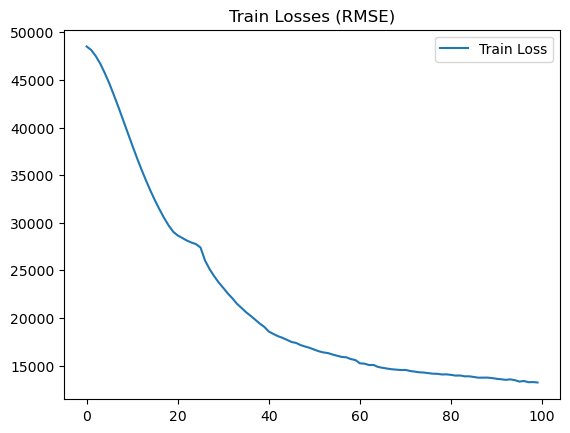

In [29]:
plt.plot(train_losses, label='Train Loss')
plt.title('Train Losses (RMSE)')
plt.legend()
plt.show()

### (Load a past model)

In [14]:
'''
This code is used only for loading the model and checking its prediction.
'''
# # set name of the model
# model_num = 20

# # load the model and its loss
# model = torch.load('/Users/koki/PycharmProjects/MasterThesis/models/model_' + str(model_num).zfill(2) + '.pth')
# loss = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='losses', usecols=[model_num-1])
# train_losses = loss.iloc[:,0].to_list()

'\nThis code is used only for loading the model and checking its prediction.\n'

### Predict

In [30]:
num_features_pred = yaml_data['training']['num_features_pred']

# make y_pred df
pred_val = predict(model = model, dataset = valid_dataset_for_pred, num_features_pred = num_features_pred)
y_pred_val = pd.DataFrame(pred_val, columns=df.columns[:num_features_pred], index=df_valid.index).add_prefix('pred_')

  0%|          | 0/365 [00:00<?, ?it/s]

### Calculate RMSE and MAE (predicted values and actual values)

In [31]:
def calc_rmse_mae(df_true, df_pred):
    rmse, mae = {}, {}
    for i in range(df_pred.shape[1]):
        rmse[df.columns[i][:-6]] = mean_squared_error(df_true.iloc[:,i], df_pred.iloc[:,i], squared=False)
        mae[df.columns[i][:-6]] = mean_absolute_error(df_true.iloc[:,i], df_pred.iloc[:,i])

    rmse_actu = pd.Series(rmse)
    mae_actu = pd.Series(mae)

    print('------------RMSE------------')
    print(rmse_actu)
    print('Average :', np.mean(rmse_actu))
    print('------------MAE-------------')
    print(mae_actu)
    print('Average :', np.mean(mae_actu))

    return rmse_actu, mae_actu

In [32]:
rmse_pre_actu, mae_pre_actu = calc_rmse_mae(df_valid, y_pred_val)

------------RMSE------------
渋谷駅      57202.612836
新宿駅      63820.759775
町田駅      12017.952659
川崎駅      17129.573252
立川駅      21146.594442
八王子駅      7941.799120
北千住駅      9455.872536
東京駅      63258.145524
赤羽駅       6304.334478
自由が丘駅     7476.088907
dtype: float64
Average : 26575.373353012896
------------MAE-------------
渋谷駅      44229.133649
新宿駅      48147.380639
町田駅       9314.417666
川崎駅      13801.571746
立川駅      16292.871548
八王子駅      6739.657539
北千住駅      7551.025526
東京駅      45446.569477
赤羽駅       5219.630652
自由が丘駅     5750.800487
dtype: float64
Average : 20249.305892752032


In [33]:
def plot_population(y_true, y_pred, flag='plot', anomaly_datetime=None, anomaly_next_hours=None):
    # plot with plotly     
    for i in tqdm(range(y_pred.shape[1])):
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=y_true.index, y=y_true.iloc[:, i], name=y_true.columns[i]))
        fig.add_trace(go.Scatter(x=y_pred.index, y=y_pred.iloc[:, i], name=y_pred.columns[i]))

        fig.update_xaxes(title="Date",showgrid=False)
        fig.update_yaxes(title="Population", showgrid=False)
        fig.update_layout(legend=dict(x=0.99,
                                  y=0.99,
                                  xanchor='right',
                                  yanchor='top',
                                  orientation='h',
                                  ),
                          hovermode='x unified',
                          title=dict(text=y_true.columns[i],
                                     font=dict(size=20, color='grey'),
                                     xref='paper', # container or paper
                                     x=0.5,
                                     y=0.85,
                                     xanchor='center'
                                    )
                         )

        if flag == 'anomaly_detection_tokyo':
            for t, next_t in zip(anomaly_datetime, anomaly_next_hours): 
                fig.add_vrect(
                            x0=t,
                            x1=next_t,
                            fillcolor='pink',
                            opacity=0.9,
                            line_width=0,
                            layer='below'
                            )
        
        elif flag == 'anomaly_detection':
            for t, next_t in zip(anomaly_datetime[i], anomaly_next_hours[i]): 
                fig.add_vrect(
                            x0=t,
                            x1=next_t,
                            fillcolor='pink',
                            opacity=0.9,
                            line_width=0,
                            layer='below'
                            )
        
        fig.show()

  0%|          | 0/10 [00:00<?, ?it/s]

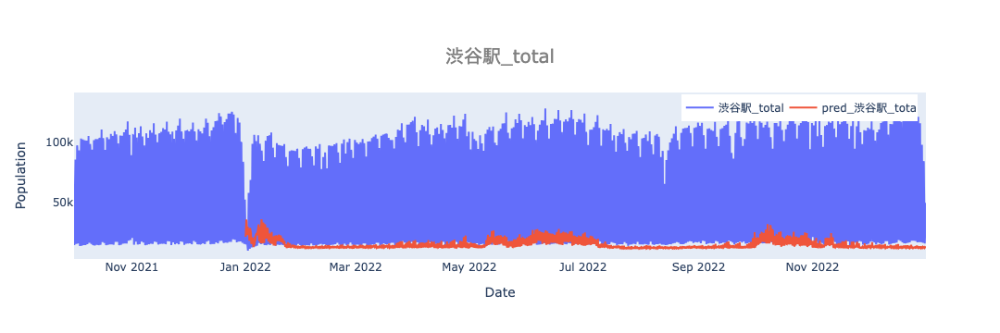

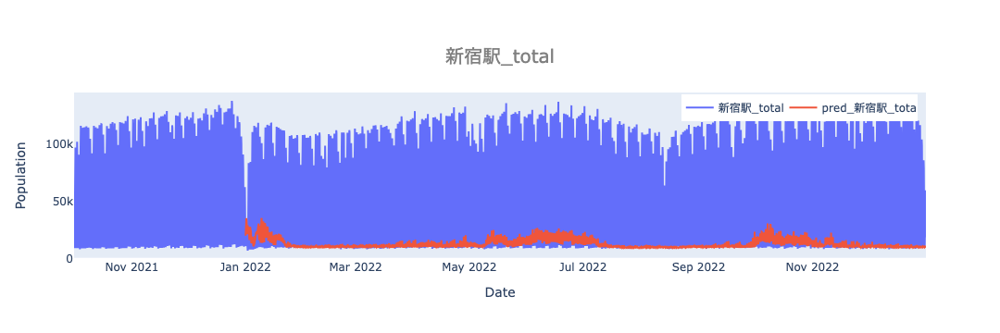

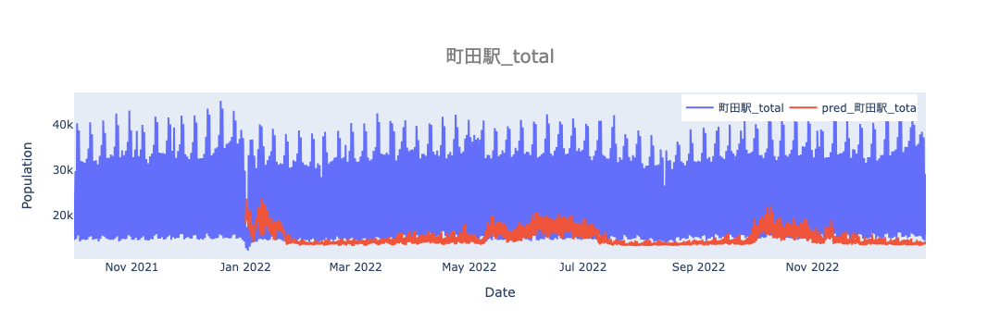

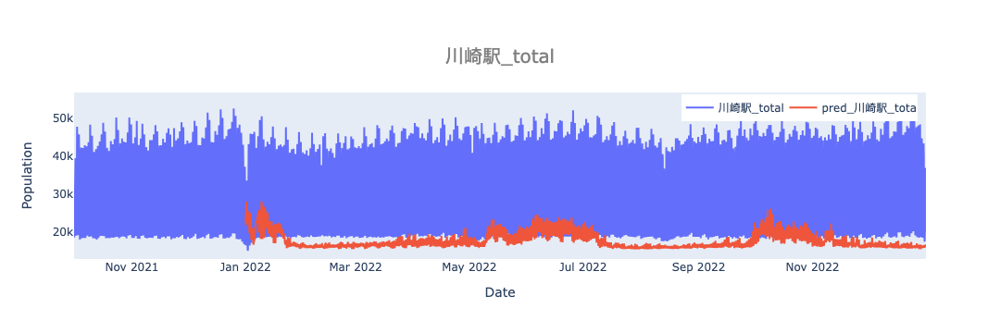

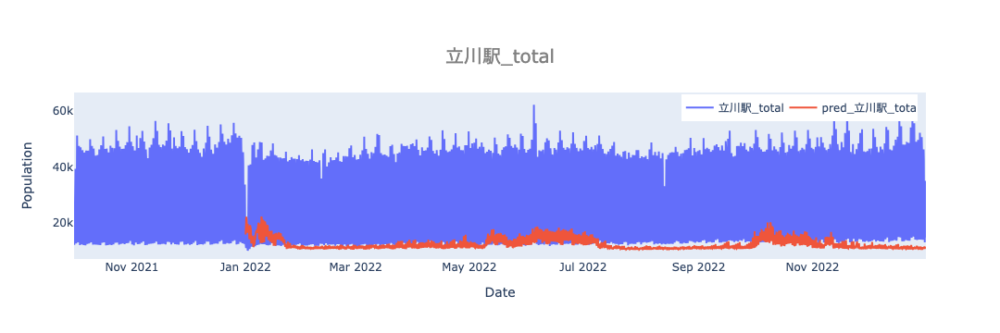

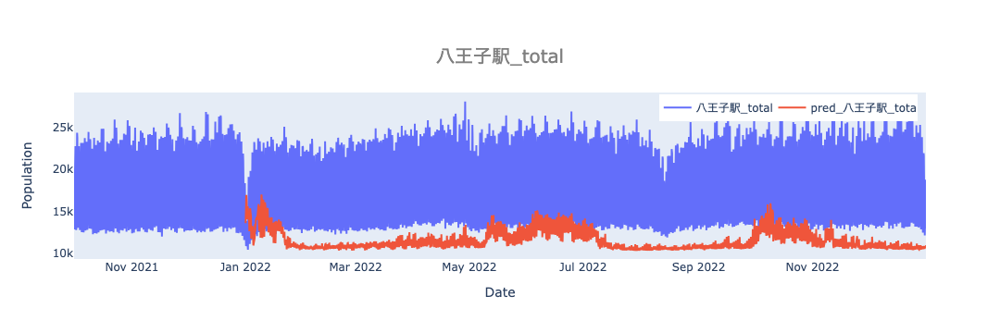

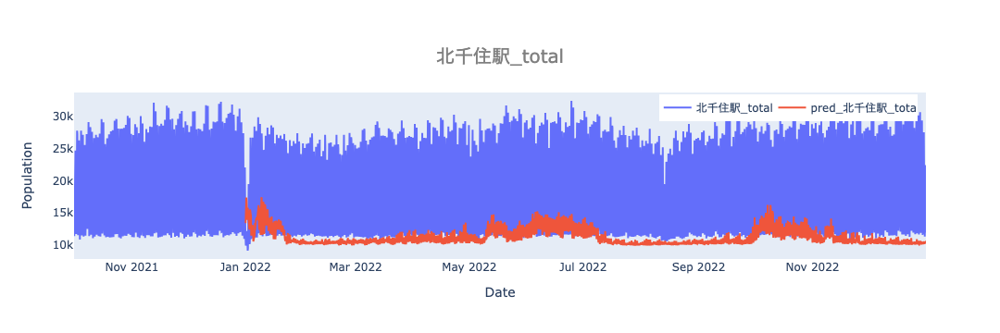

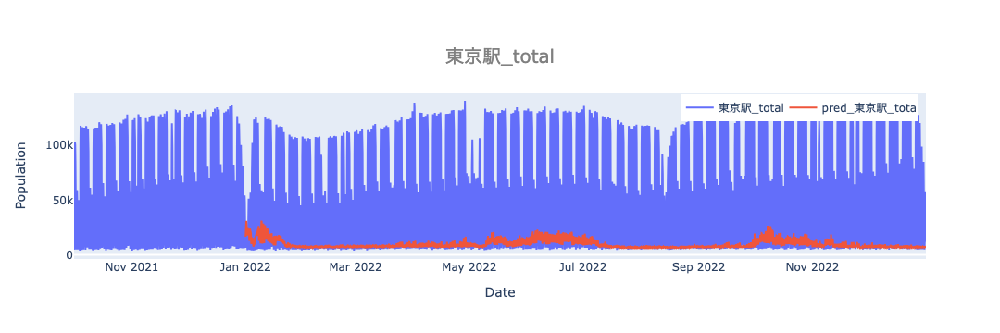

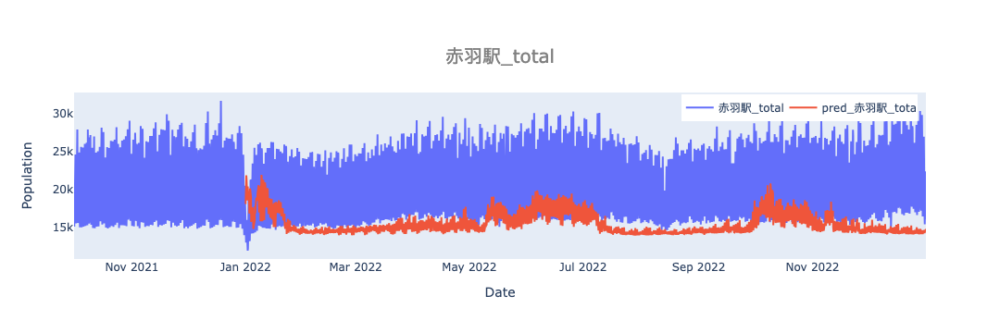

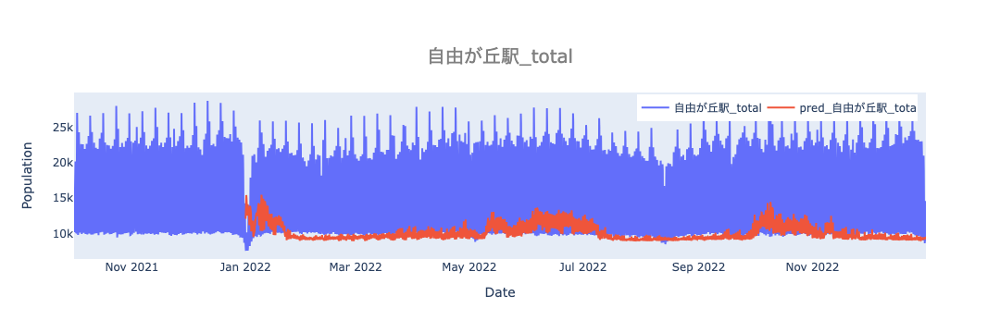

In [36]:
# make y_true df from a specific date
_df_train = df_train.loc['2021-10-01': ,:]
y_true_val = pd.concat([_df_train, df_valid]).iloc[:, :num_features_pred]
# y_true = df.loc['2021-10-01':valid_end, :].iloc[:, :num_features_pred]

plot_population(y_true_val, y_pred_val, flag='plot')

### Calculate RMSE and MAE (benchmark and actual values)

In [37]:
def get_benchmark(target_df):
    # useful variables
    num_features_pred = yaml_data['training']['num_features_pred']
    dow_list = ['dow_Mon','dow_Tue','dow_Wed','dow_Thu','dow_Fri','dow_Sat', 'dow_Sun']

    # df setup
    bench_true = target_df.iloc[:, :num_features_pred]
    bench_pred = pd.DataFrame([], columns=df.columns[:num_features_pred])
    df_ref = df[target_df.index[0] - datetime.timedelta(weeks=4):target_df.index[0]].iloc[:-1]
    # df_ref = df[target_df.iloc[0].index - datetime.timedelta(weeks=4):target_df.iloc[0].index]
    df_ref['hour'] = df_ref.index.map(lambda d: d.hour)

    # compute benchmark for every datetime in target_df
    for dt in tqdm(target_df.index):
        # get data from df_ref and compute mean
        query = f'{dow_list[dt.weekday()]} == 1 & hour == {dt.hour} & official_holiday == 0 & unofficial_holiday == 0' # dow, hour, and non-holiday
        bench_pred.loc[dt] = df_ref.query(query).iloc[:, :num_features_pred].mean()

        # remove the first row and add a new row to df_ref
        df_ref = df_ref.drop(index=df_ref.index[0])
        df_ref.loc[dt] = pd.concat([df.loc[dt], pd.Series(dt.hour, index=['hour'])])  # add new row [data, hour]

    return bench_true, bench_pred

In [38]:
df_bench_true, df_bench_pred = get_benchmark(df_valid)

# calculate RMSE and MAE
rmse_ben_actu, mae_ben_actu = calc_rmse_mae(df_bench_true, df_bench_pred)

  0%|          | 0/2920 [00:00<?, ?it/s]

------------RMSE------------
渋谷駅       7727.141612
新宿駅       8546.159427
町田駅       1630.643300
川崎駅       1774.348412
立川駅       2399.364390
八王子駅      1023.885480
北千住駅      1325.384721
東京駅      11087.016460
赤羽駅       1178.189311
自由が丘駅     1193.584916
dtype: float64
Average : 3788.571803030284
------------MAE-------------
渋谷駅      4027.962015
新宿駅      3979.285388
町田駅       865.459247
川崎駅       986.748944
立川駅      1230.846575
八王子駅      590.564840
北千住駅      742.897061
東京駅      4524.321575
赤羽駅       724.764212
自由が丘駅     584.687557
dtype: float64
Average : 1825.7537414383557


  0%|          | 0/10 [00:00<?, ?it/s]

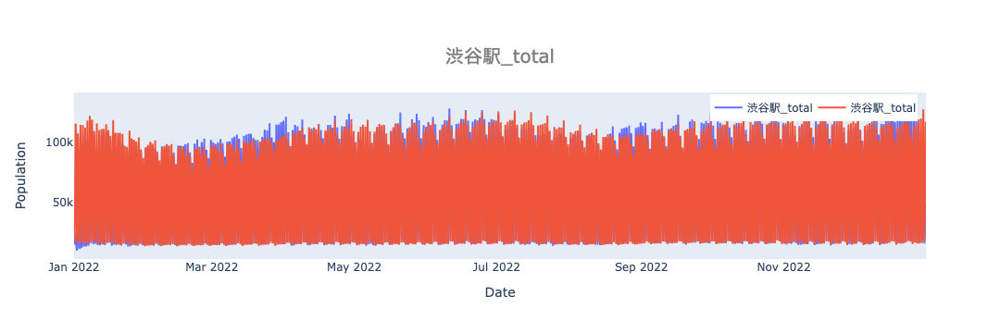

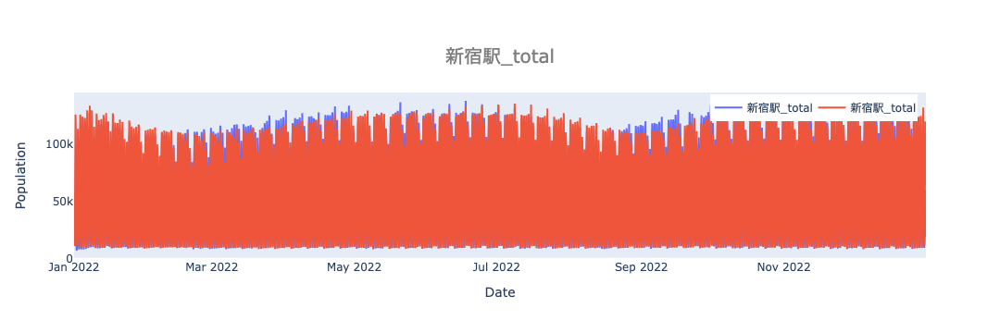

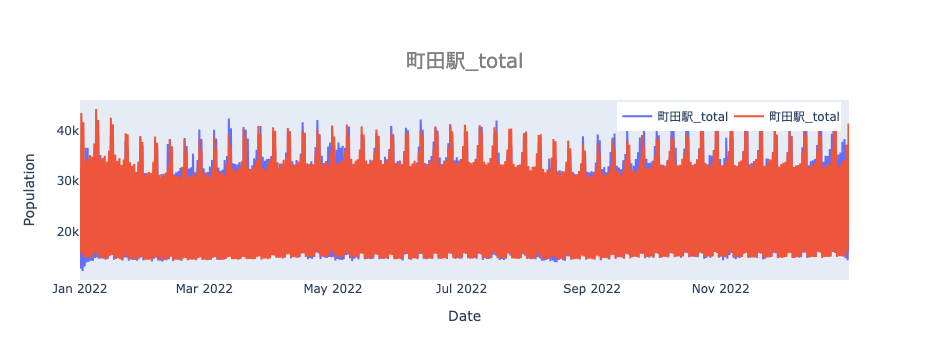

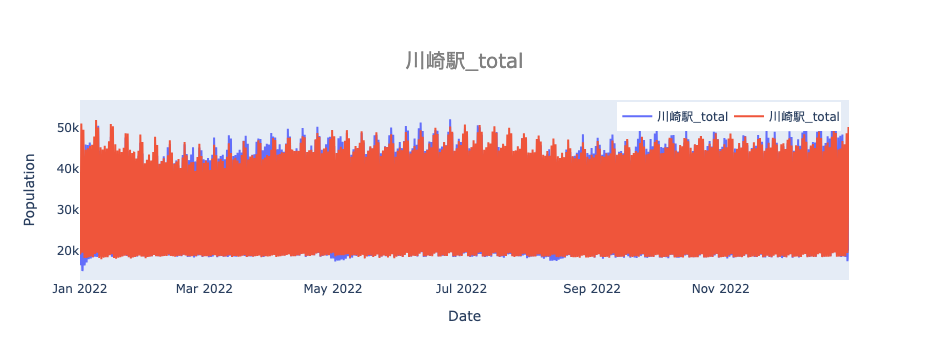

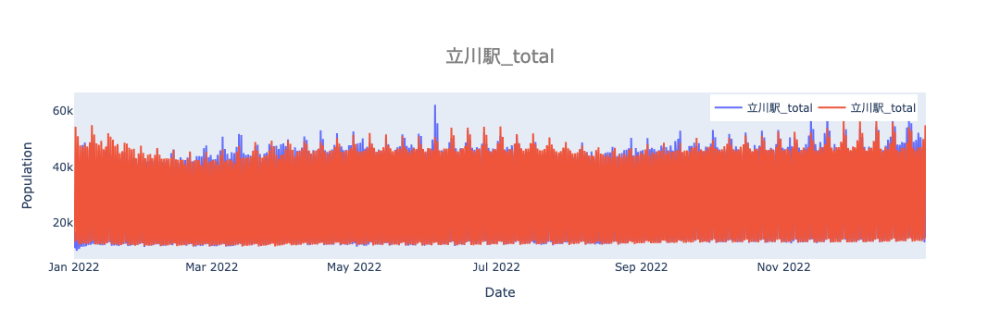

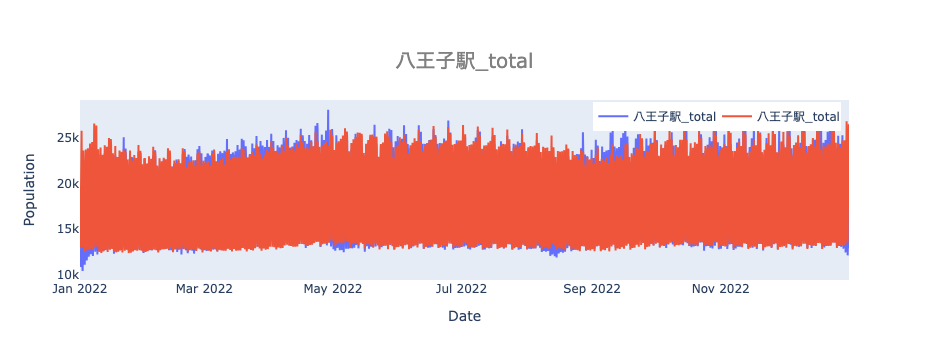

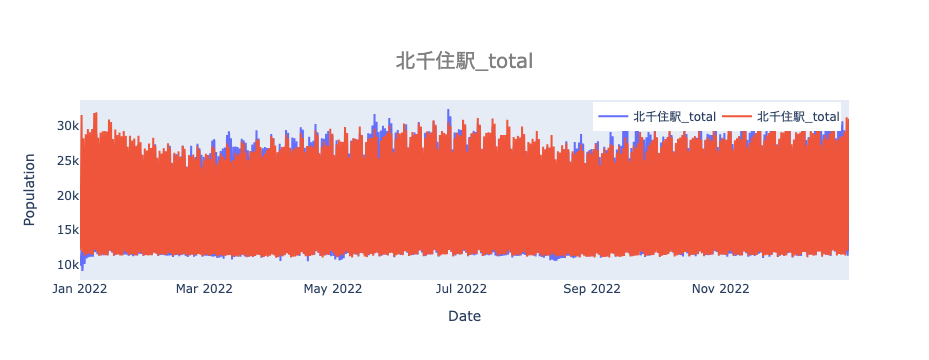

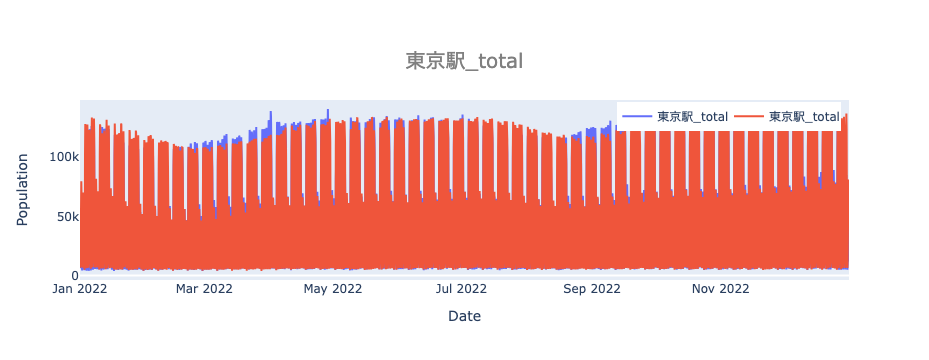

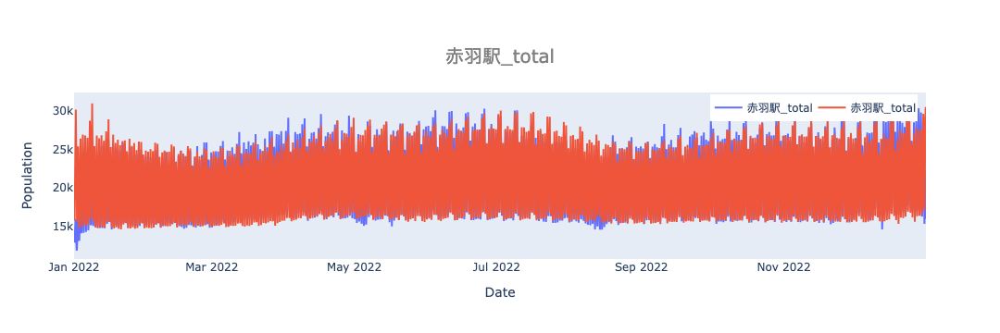

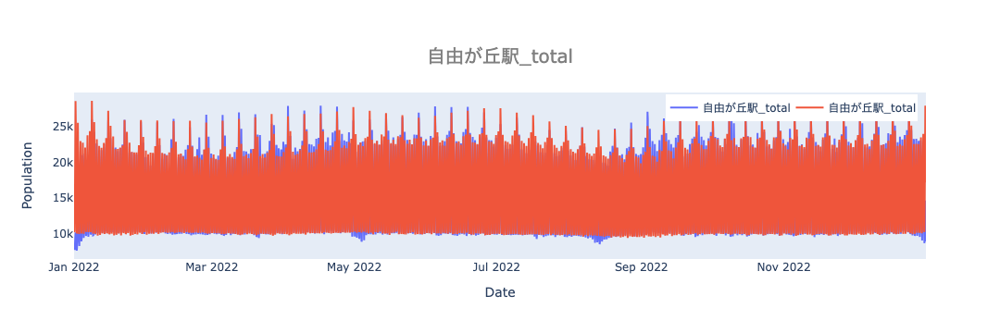

In [39]:
plot_population(df_bench_true, df_bench_pred, flag='plot')

### Anomaly detection for each location

In [28]:
def calc_anomaly_scores(matrix_valid, matrix_test):
    '''
    : calculate anomaly scores at each day by quadratic form
    : matrix_valid :  valid data for calculating mean and variance;  numpy array
    : matrix_test  :  test data for getting anomaly scores;  numpy array
    : return       :  anomaly_scores; numpy array
    '''
    # compute mean and cov inverse
    mean = np.matrix(matrix_valid.mean(axis=0))
    cov_inv = np.matrix(np.cov(matrix_valid, rowvar=False)).getI()

    # apply quadratic formula to each row of matrix
    output = np.zeros(matrix_test.shape[0])
    for i in range(matrix_test.shape[0]):
        output[i] = ((matrix_test[i] - mean) * cov_inv * np.transpose(matrix_test[i] - mean)).item(0)

    return output


def get_anomaly_date(anomaly_scores, threshold):
    '''
    : get datetime when anomaly is detected
    : anomaly_scores    :  anomaly scores calculated from df_test; numpy 1d array
    : threshold         :  threshold; float
    : return            :  anomaly_datetime, anomaly_next_date; numpy array
    '''
    # get the dates where anomaly_scores > threshold
    dates = pd.date_range(start=df_test.index[0], end=df_test.index[-1])
    anomaly_date = dates[anomaly_scores > threshold]
    print("num of anomaly-detected data:", anomaly_date.shape[0])
    print()

    # get the next date when anomaly is detected
    anomaly_next_date = []
    for date in anomaly_date:
            anomaly_next_date.append(date + datetime.timedelta(days=1))

    return anomaly_date, anomaly_next_date


def anomaly_detection(name):
    '''
    : main function for ano,aly detection
    : name       :  column name for anomaly detection; str
    : return     :  anomaly_date, anomaly_next_date; numpy array
    '''
    # compute anomaly scores using valid data
    valid_diff = np.reshape(np.array(df_valid[name] - y_pred_val['pred_' + name]), (-1, 8))   ######### use Y_PRED_VALID #########
    anomaly_scores = calc_anomaly_scores(valid_diff, valid_diff)

    # set top 1% score as threshold for test_data
    threshold = np.percentile(anomaly_scores, 99)
    print(f'{name} threshold:', threshold)

    # compute anomaly scores using test data
    test_diff = np.reshape(np.array(df_test[name] - y_pred_test['pred_' + name]), (-1, 8))   ######### use Y_PRED_TEST #########
    anomaly_scores = calc_anomaly_scores(valid_diff, test_diff)

    # anomaly detection
    return get_anomaly_date(anomaly_scores, threshold)

In [29]:
# predict with test data
pred_test = predict(model = model, dataset = test_dataset_for_pred, num_features_pred = num_features_pred)
y_pred_test = pd.DataFrame(pred_test, columns=df.columns[:num_features_pred], index=df_test.index).add_prefix('pred_')

all_anomaly_date, all_anomaly_next_date = [], []
for i in range(num_features_pred):
    anomaly_date, anomaly_next_date = anomaly_detection(df.columns[i])
    all_anomaly_date.append(anomaly_date)
    all_anomaly_next_date.append(anomaly_next_date)

  0%|          | 0/273 [00:00<?, ?it/s]

渋谷駅_total threshold: 44.19063698925048
num of anomaly-detected data: 3

新宿駅_total threshold: 35.20466162298469
num of anomaly-detected data: 6

町田駅_total threshold: 33.10803275004677
num of anomaly-detected data: 3

川崎駅_total threshold: 36.67666957090749
num of anomaly-detected data: 3

立川駅_total threshold: 35.645289874032805
num of anomaly-detected data: 5

八王子駅_total threshold: 27.482829151226564
num of anomaly-detected data: 31

北千住駅_total threshold: 26.91260064826575
num of anomaly-detected data: 10

東京駅_total threshold: 28.56818272246093
num of anomaly-detected data: 17

赤羽駅_total threshold: 29.564767351626735
num of anomaly-detected data: 19

自由が丘駅_total threshold: 30.270252713221772
num of anomaly-detected data: 5



  0%|          | 0/10 [00:00<?, ?it/s]

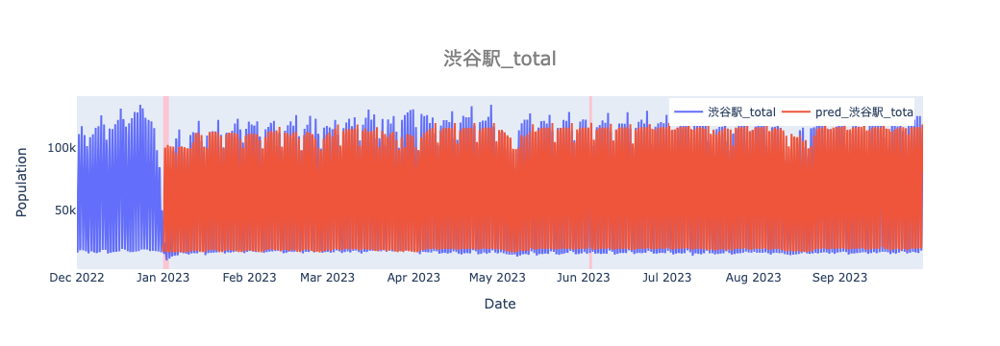

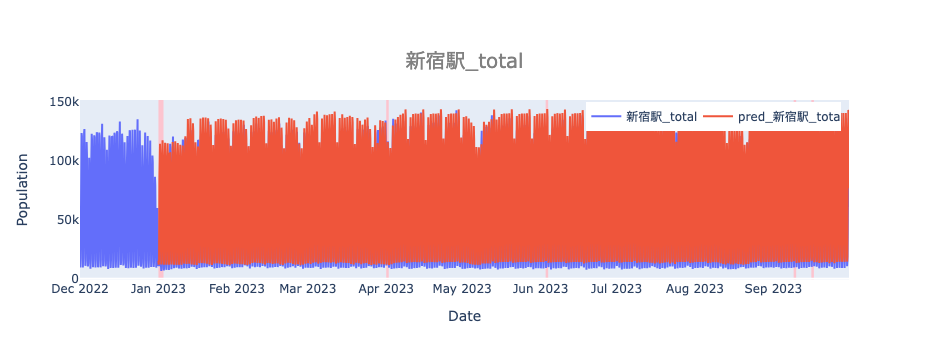

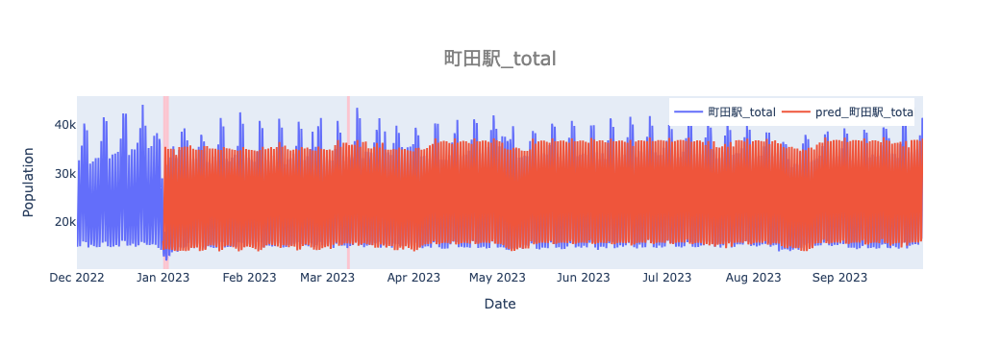

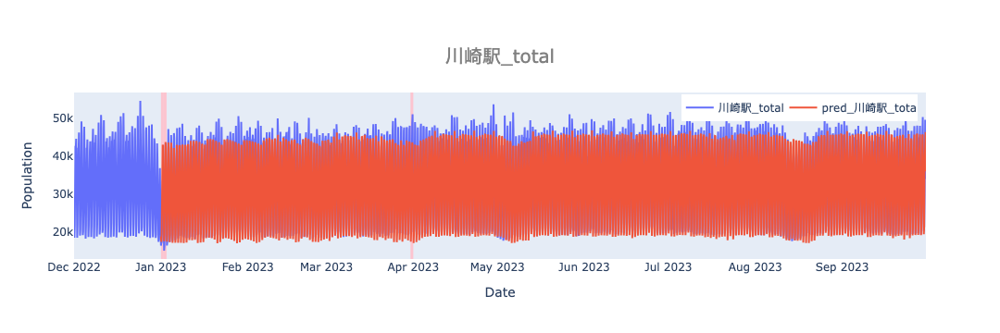

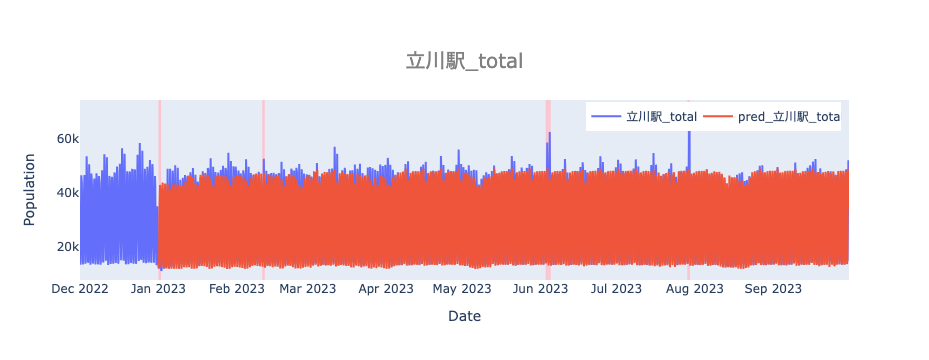

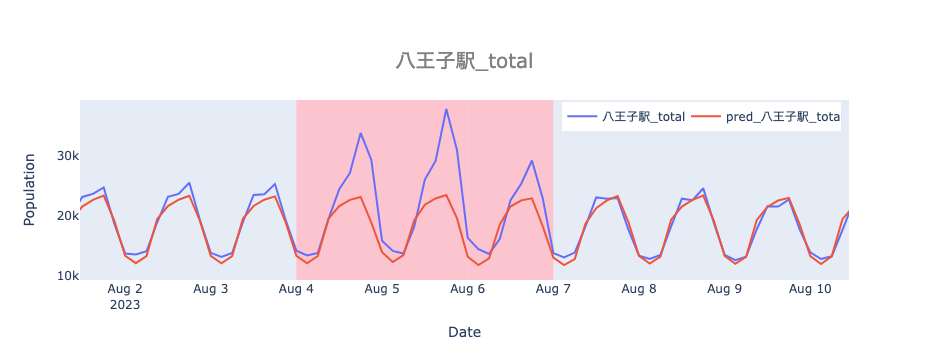

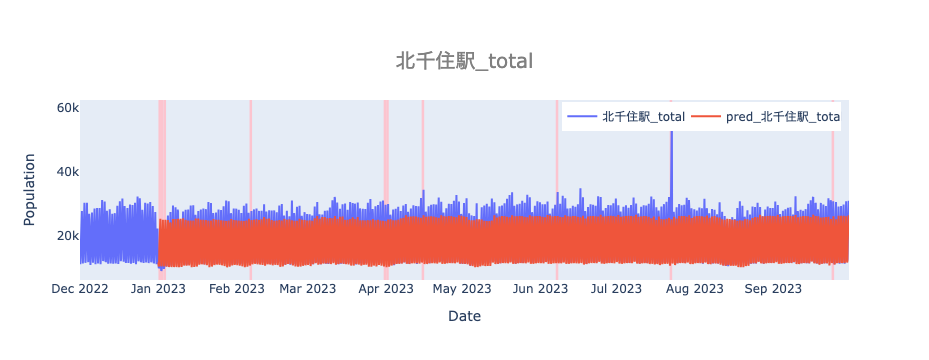

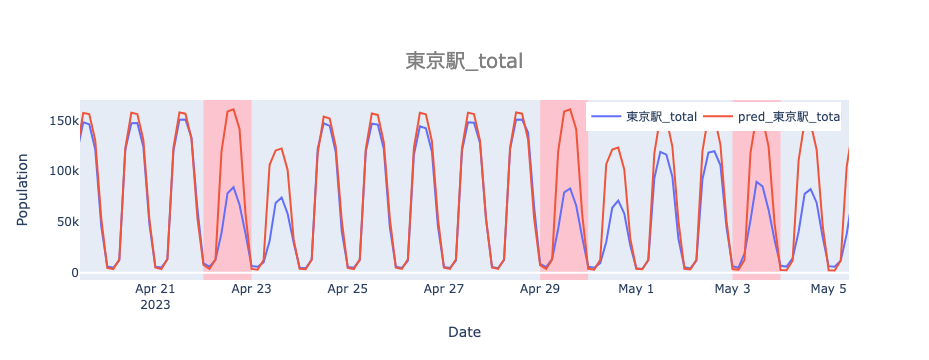

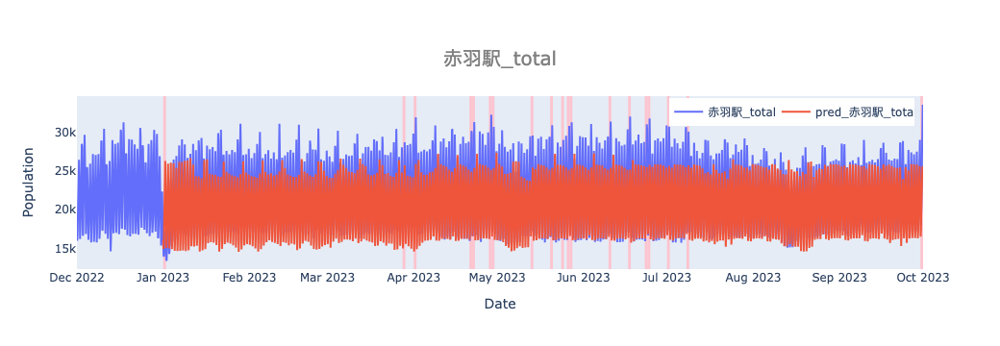

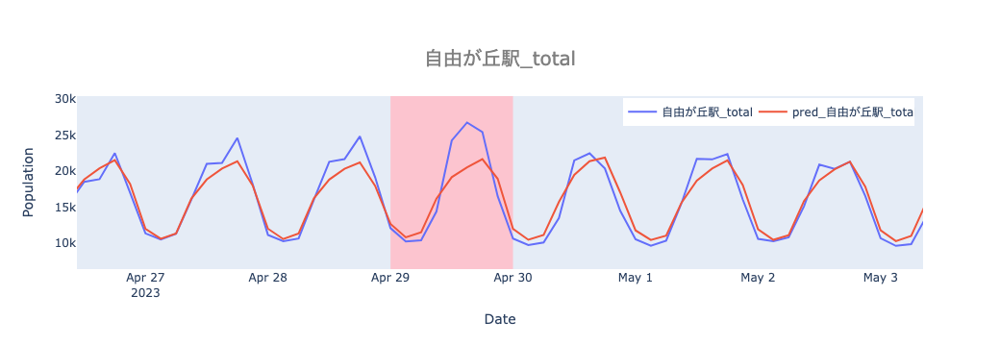

In [30]:
# make y_true df from a specific date
_df_valid = df_valid.loc['2022-12-01': ,:]
y_true_test = pd.concat([_df_valid, df_test]).iloc[:, :num_features_pred]

# plot
plot_population(y_true_test, y_pred_test, flag='anomaly_detection',
                anomaly_datetime=all_anomaly_date, anomaly_next_hours=all_anomaly_next_date)

### Save the results and the model

In [40]:
'''
save the model, its loss, and params used
'''
# count the number of files in the directory
path = '/Users/koki/PycharmProjects/MasterThesis/models'

# read parameter data
df1 = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='params')

# set a model name
num = 'model_' + str(df1.shape[0]+1).zfill(2)

# get params used in this file
series = pd.concat([pd.Series(yaml_data['dataset']), pd.Series(yaml_data['model']), pd.Series(yaml_data['training'])])
params = pd.DataFrame(series).T
params.insert(0, "num", num)
params.insert(1, "file_name", "Transformer_ver04")  ###### the name of this file! ######
params.insert(2, "date_of_execution", datetime.datetime.today().strftime("%Y-%m-%d %H:%M"))
params.insert(3, "execution_time", elapsed_time)
params.insert(params.shape[1], "final_train_loss" , math.floor(train_losses[-1]))
params.insert(params.shape[1], "rmse_pred_actu" , math.floor(np.mean(rmse_pre_actu)))
params.insert(params.shape[1], "mae_pred_actu" , math.floor(np.mean(mae_pre_actu)))
params.insert(params.shape[1], "rmse_ben_actu" , math.floor(np.mean(rmse_ben_actu)))
params.insert(params.shape[1], "mae_ben_actu" , math.floor(np.mean(mae_ben_actu)))
df1 = pd.concat([df1, params])

# read loss data
df2 = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='train_losses')
df2 = pd.concat([df2, pd.Series(train_losses, name=num)], axis=1)

# export the data 
with pd.ExcelWriter('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx') as writer:
    df1.to_excel(writer, sheet_name='params', index=False)
    df2.to_excel(writer, sheet_name='train_losses', index=False)

# save the model
torch.save(model, '/Users/koki/PycharmProjects/MasterThesis/models/' + num + '.pth')

In [ ]:
# notification
# !afplay '/Users/koki/Documents/セレナと一緒/result_message.m4a'

In [ ]:
print("Done!!!")

### Memo

In [ ]:
'''
seq2seqも初期のlstmみたいにダミーを後から線形結合してみる？
positional encodingなど必要かどうかちゃんと検証する必要あり。
もっと時系列予測の論文調べる
リアルタイムに予想するなら、新たな学習データを使ってファインチューニングする？
やっぱりもっとちゃんとtrain,valid,testの分割を考えないと、統計量が違いすぎるかも。


train: 2016/01 – 2021/12 学習
valid: 2022/01 – 2022/12　予測値とベンチマークを比較、予測値と実測値を比較、mseを計算
test: 2023/01 – 2023/09　異常検知

ベンチマーク
 1. trainの1月の曜日ごとの平均を計算（7個の値が出てくる）（祝日等は人流が変わるので抜いて計算）
 2. それをベンチマークから作った1月の予測値とする
 3. 各月について1と2を繰り返す
 
学習用とテスト用でデータセットの作り方を変える
seq_len_src=56の場合
学習用：1期ずつずらしていく
        src: t=1–56, tgt: t=57-64
             t=2-57,      t=58-65
テスト用：1日ずつずらしていく
        src: t=1–56, tgt: t=57-64
             t=9-64,      t=65–72
             
seq_len_src=8の場合
学習用：1期ずつずらしていく
        src: t=1–8, tgt: t=9-16
             t=2-9,      t=10-17
テスト用：1日ずつずらしていく
        src: t=1–8, tgt: t=9-16
             t=9-16,     t=17–24 
             
seq_len_src=28の場合
学習用：1期ずつずらしていく
        src: t=1–28, tgt: t=29-32
             t=2-29,      t=30-33
テスト用：1日ずつずらしていく
        src: t=1–28, tgt: t=29-32
             t=5-32,      t=33–36 
             
[seq2seq]
学習の仕方：
 t=1–8→encoder, t=8,9-15→decoder→t=9-16→loss計算,
 
テストの仕方：
 t=1–8→encoder, t=8→decoder→t=9→decoder→t=10→...→t=15→decoder→t=16

[lstm]
学習の仕方：
 t=1–8→lstm→t=2-9→loss計算,
 
テストの仕方：
 t=1–8→lstm→t=9→lstm→t=10→...→t=16→lstm→t=17

'''

### Questions

In [ ]:
'''
3ヶ月予測は、データセットのtime_stepを3ヶ月に作り直すのか、それとも今のままでただ3ヶ月分予測するだけか。
 - データセットはそのままで、ただ3ヶ月先まで予測すれば良いだけ。
   9/1（t=1,...,8）を入力して9/2（t=9,...,16）を予測したら、次はその予測された9/2（t=9,...,16）を入力して9/3（t=17,...,24）を予測する。
 
lstmの予測はループさせるの？
 - yes
 - 単純なlstmの場合、（t=1,...,8）を入力するとそれぞれの値の一期先（t=2,...,9）を出力するだけなので、やはりループが必要。
　
loss計算を人流だけで行うのは本当に正しい？
 - yes
 - 人流以外を予測するのは理にかなってない。（そうなるとn225も外すべきかも）

異常検知はただ予測値と実測値の差を求めて、それが閾値を超えてたら異常と判断すれば良いの？
 - yes
 - 異常検知の場合validも作る　train:2016-2021, valid:2021-2022, test:2023/01/-2023/09
 - 東京の異常を見るときは、数字を一つにまとめる。（二次形式を作り、validdataの平均分散を用いて計算する。詳しくは写真を参照のこと。）
 - time stepの数を減らす（e.g., 朝昼夕の3期）
 
ベンチマークの作りかたをもっと詳しく
 - 
 
コロナ関連のイベントダミーの作り方（e.g., ワクチン開発された、など）はどう作る。その日以降がずっと1になる？それともその日だけ1？
 - 

validationの使い道
 - 


'''

### Insight

In [ ]:
'''
学習率は0.0001じゃないとダメそう。
バッチが大きいとエポックの進みは早いが学習率を小さくしないと上手くいかず、結果的に収束するまで時間がかかる。
バッチが小さいと学習率は比較的大きくて大丈夫だが、学習が遅い。
'''

### To Do

In [ ]:
'''
コロナダミー作成 done
コロナ関連のイベントダミー作成 done
seq2seq, lstmのコードもいじる done
時間によって変わる経済変数をもっと入れる（犯罪数、ドル円レート）
データを2016-2023に増やす done
3ヶ月くらい予測してmseで比較 done
長期予測と比較できるようにbenchmarkを作り直す done
訓練データ内にある災害などの日を見て、そこが異常検知できてるかどうか見てみる。
予測値を使って異常検知 done
リアルタイムに異常検知できるようにする
学習の実行時間もエクセルに載せたい done
positional encodingを改良
'''